In [1]:
#Importando as bibliotecas
import numpy as np
import tifffile as tif
import rasterio as rio
import glob
import matplotlib.pyplot as plt
from spectral import imshow

In [2]:
import matplotlib
matplotlib.rcParams['figure.figsize']=(20,16)

In [3]:
## Le as bandas como numpyarray sem onerar a memória.(boa prática)
with rio.open('dados/sentinel/S2A_R10m/T23KQS_20210915T130251_B02_10m.jp2') as src1:
    b02 = src1.read()
with rio.open('dados/sentinel/S2A_R10m/T23KQS_20210915T130251_B03_10m.jp2') as src2:
    b03 = src2.read()
with rio.open('dados/sentinel/S2A_R10m/T23KQS_20210915T130251_B04_10m.jp2') as src3:
    b04 = src3.read()
with rio.open('dados/sentinel/S2A_R10m/T23KQS_20210915T130251_B08_10m.jp2') as src4:
    b08 = src4.read()

In [4]:
# Reorganiza aordem do shape da imagem.
def swap_rio(img):
    img = img.swapaxes(0,2)
    img = img.swapaxes(0,1)
    return img

In [5]:
b02 =swap_rio(b02)
b03 =swap_rio(b03)
b04 =swap_rio(b04)
b08 =swap_rio(b08)

In [6]:
# Empilha as bandas.
cubo = np.dstack([b02,b03,b04,b08])

In [7]:
def expansao(img, percent_min=2, percent_max=98):
    img2 = np.zeros_like(img)# Gera uma matriz cópia do shape da imagem original com zeros.
    x,y = 0,255
    pmin = np.percentile(img, percent_min)
    pmax = np.percentile(img, percent_max)
    f = x + (img - pmin) * (y - x) / (pmax - pmin)
    
    f[f < x] = x
    f[f > y] = y
    img2 = f
    return img2

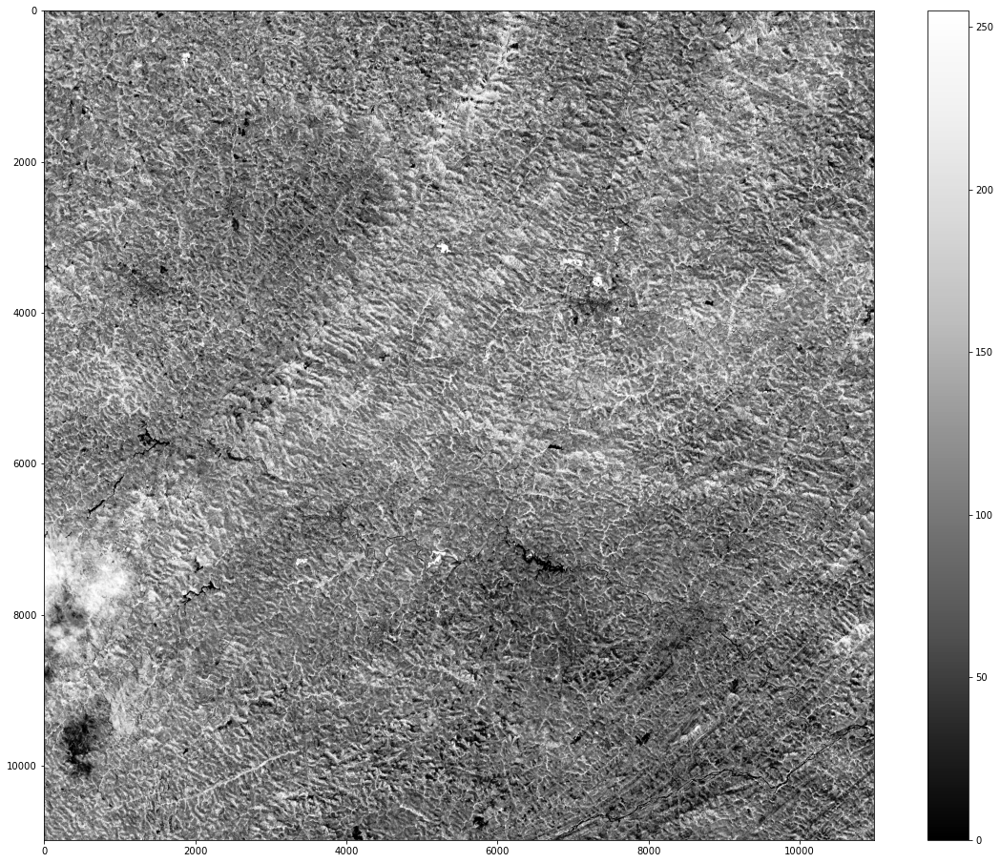

In [8]:
#Plotando uma banda com expansão de histograma 
plt.imshow(expansao(b08),cmap='Greys_r')
plt.colorbar()
plt.show()

ImageView object:
  Display bands       :  (2, 1, 0)
  Interpolation       :  <default>
  RGB data limits     :
    R: [368.0, 1678.0]
    G: [484.0, 1196.0]
    B: [328.0, 847.0]

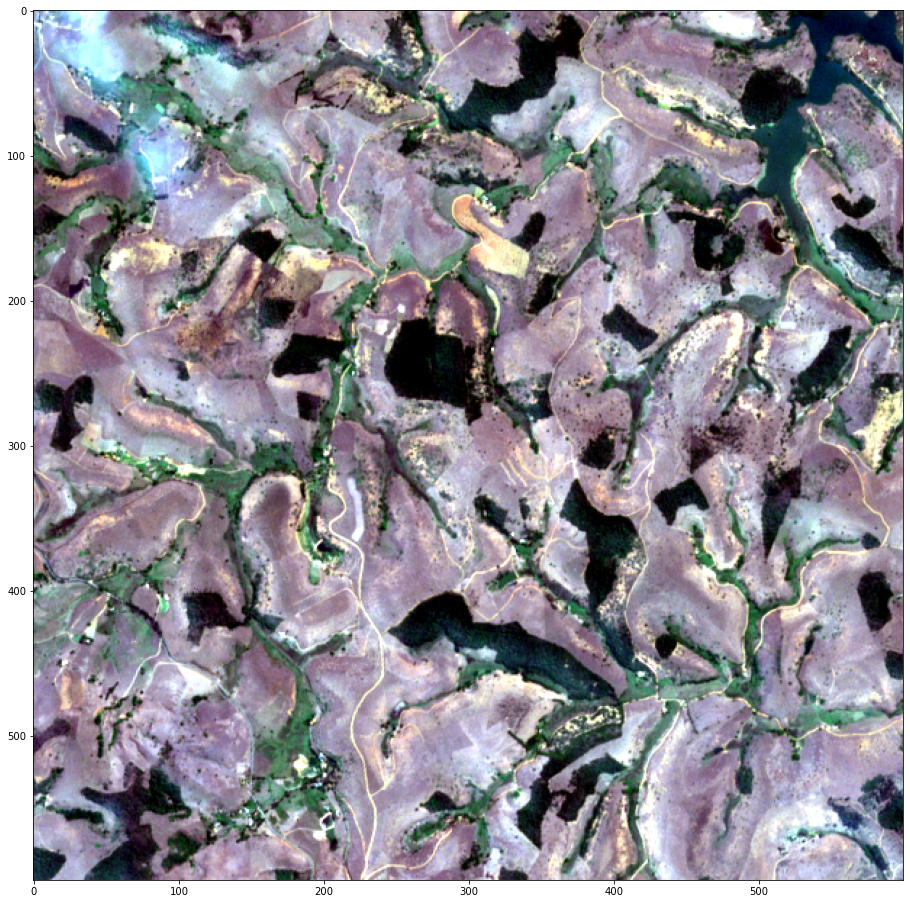

In [9]:
#Plotando imagem fatiada com composição de bandas do visível.
imshow(cubo[7400:8000,6000:6600], (2,1,0), stretch=(0.02,0.98))

In [10]:
#Gerando o ndvi .
np.seterr(divide='ignore', invalid='ignore')# Permite a divisão por zero.
ndvi = (b08.astype(float) - b04.astype(float))/(b08 + b04)

ImageView object:
  Display bands       :  [0]
  Interpolation       :  <default>
  RGB data limits     :
    R: [0.15155526141628062, 0.8096723868954758]
    G: [0.15155526141628062, 0.8096723868954758]
    B: [0.15155526141628062, 0.8096723868954758]

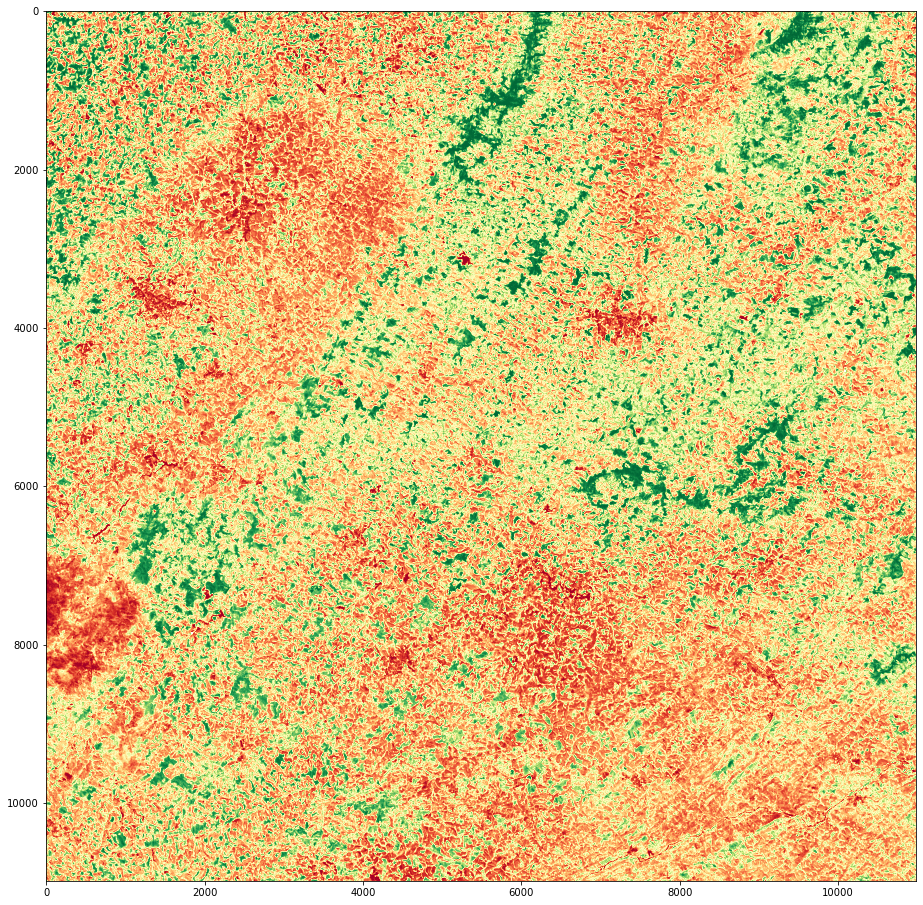

In [11]:
#Plotando ndvi para cena completa.
imshow(ndvi, stretch=(0.02,0.98), cmap='RdYlGn')

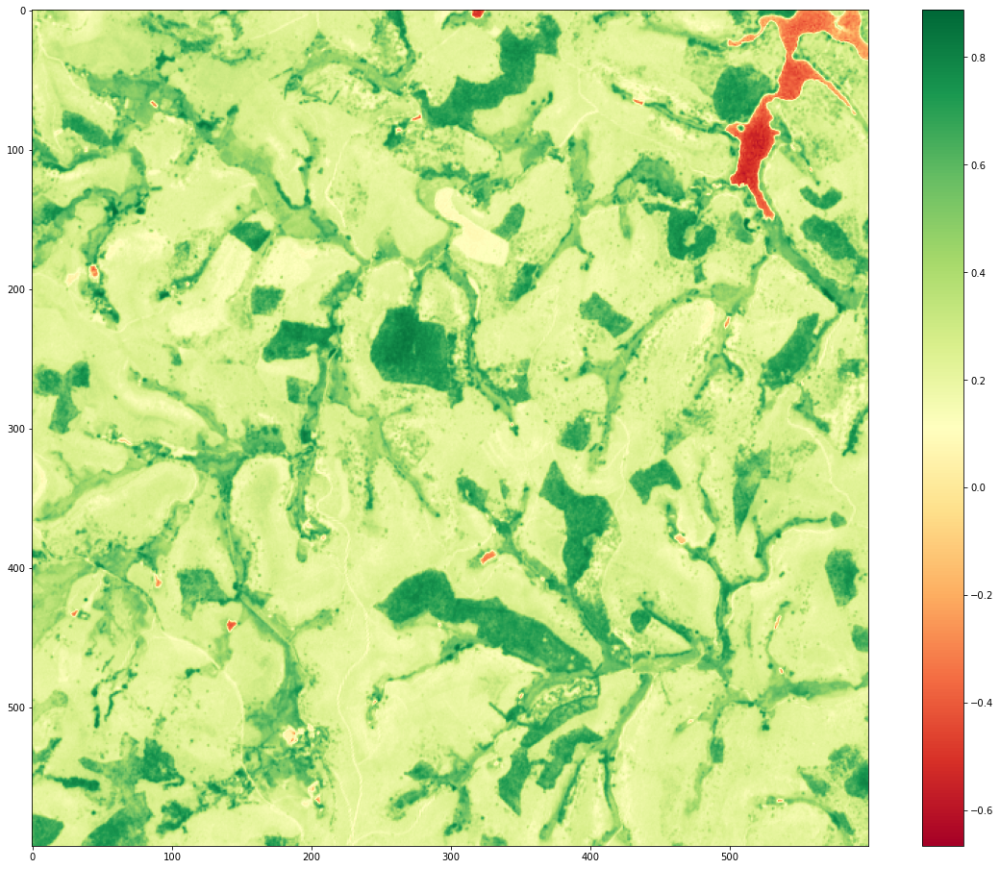

In [14]:
#Plotando NDVI com expansão de histograma da imagem fatiada.
plt.imshow(ndvi[7400:8000,6000:6600], cmap='RdYlGn')
plt.colorbar()
plt.show()

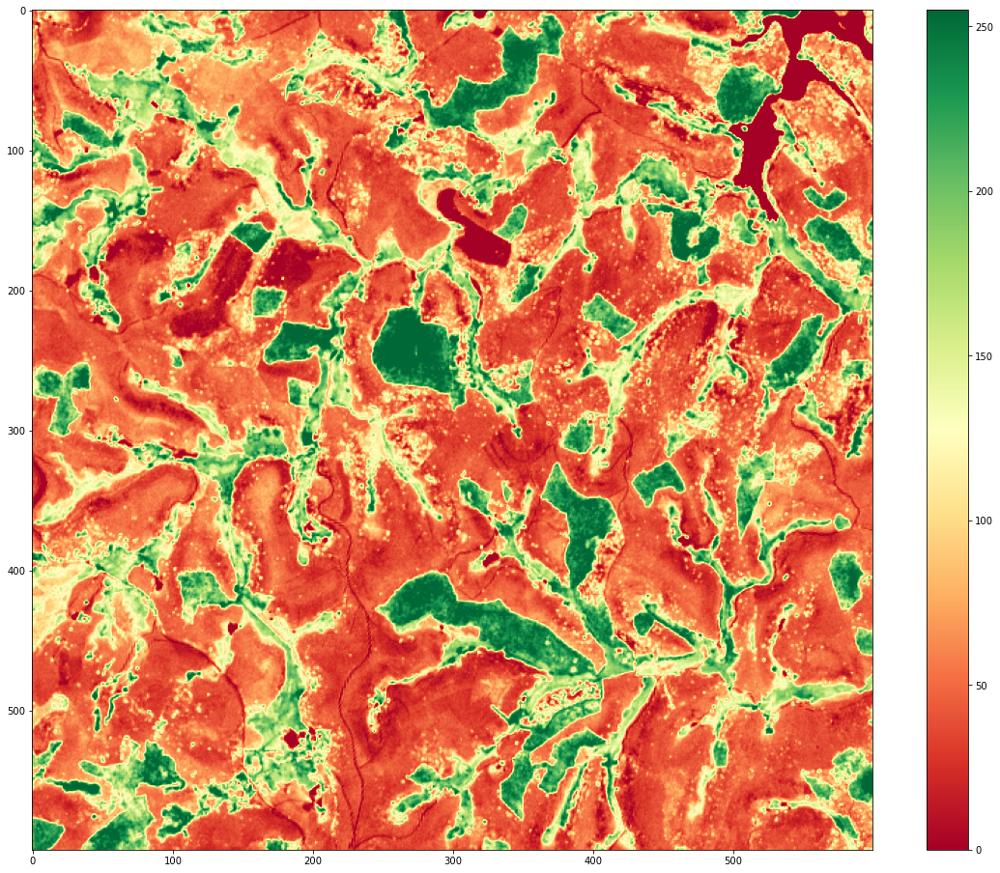

In [12]:
#Plotando NDVI com expansão de histograma da imagem fatiada.
plt.imshow(expansao(ndvi[7400:8000,6000:6600]), cmap='RdYlGn')
plt.colorbar()
plt.show()

In [15]:
ndvi=b02=b03=b04=b08=cubo=None